In [ ]:
#%matplotlib ipympl

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
from pathlib import Path
sys.path.append(str(Path('..')))
sys.path.append(str(Path('../..') / 'axonml'))
#If needed:
#Specify Cajal's path according to your installation.
sys.path.append(str(Path('../..') / 'cajal'))

In [3]:
import numpy as np
from functools import partial
import matplotlib.pyplot as plt
import tensorflow as tf

from online_neuro.bayessian_optimizer import AskTellOptimizerHistory
from online_neuro.online_learning import build_model
from online_neuro.utils import CustomMinMaxScaler

from trieste.data import Dataset
from trieste.acquisition.function import BayesianActiveLearningByDisagreement
from trieste.acquisition.rule import EfficientGlobalOptimization
from trieste import space

from cajal.nrn import Backend as N
from cajal.nrn.cells import MRG
from cajal.units import mm, um, mV, ms
from cajal.nrn.sources import IsotropicPoint
from cajal.units import mA, ms, ohm, cm, um
from cajal.nrn.monitors import StateMonitor, APMonitor
from cajal.nrn import SimulationEnvironment

from neuron import h
from cajal.nrn.stimuli import MonophasicPulse
from simulators.python.pulses import PulseRamp

2025-01-17 20:47:07.119388: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-17 20:47:07.147094: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-17 20:47:07.147122: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-17 20:47:07.147805: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-17 20:47:07.152413: I tensorflow/core/platform/cpu_feature_guar

In [59]:
N.dt = 0.005*ms #The default one


In [19]:
def create_mrg(diameter: um=27 , length: mm=100, v_init: mV=-80, verbose=False):
    # Create the axon without specifying axonnodes
    mrg = MRG(diameter=diameter, length=length, v_init=v_init)

    # Get the total number of nodes
    if verbose:
        print(f"Computed number of Nodes: {len(mrg.node)}")

        # Calculate total length based on node positions
        first_node_y = mrg.node[0].y3d(0)
        last_node_y = mrg.node[-1].y3d(0)
        total_length = (last_node_y - first_node_y) / 1000

        print(f"Computed Axon Length: {total_length:.2f} mm")

        for node in [mrg.node[0], mrg.node[-1]]:
            x = node.x3d(0) / 1000  # Convert to mm
            y = node.y3d(0) / 1000
            z = node.z3d(0) / 1000
            print(f"Node x={x:.2f} mm, y={y:.2f} mm, z={z:.2f} mm")

    return mrg

def plot_setup(mrg, point_sources, labels=None):
    # Extract node positions
    node_x = np.array([n.x3d(0) for n in mrg.node]) / 1000.0
    node_y = np.array([n.y3d(0) for n in mrg.node]) / 1000.0
    node_z = np.array([n.z3d(0) for n in mrg.node]) / 1000.0

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the axon
    ax.plot(node_x, node_y, node_z, color='red', label='Axon (MRG)', linewidth=2)

    # Plot electrodes
    for e, point_source in enumerate(point_sources):
        x = point_source.x.value / 1000.0
        y = point_source.y.value / 1000.0
        z = point_source.z.value / 1000.0

        label = labels[e] if labels else "Electrode"
        ax.scatter(x, y, z, color='green', s=80, marker='o', label=label)

    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.view_init(elev=20, azim=30)

    plt.title('Axon and Two Electrodes in 3D')
    plt.legend()
    plt.show()

In [73]:
from simulators.python.problems.cajal_problems import create_stimulus, create_pulse

mrg = create_mrg(diameter=27, length=100, v_init=-80)
stim_amp = -0.50 #* mA
stim_pw = 0.10 #* ms
stim_delay = 0.5 #* ms
stim = create_pulse('monophasic', amp=stim_amp, pw=stim_pw, delay=stim_delay)
block = create_pulse('pulse_ramp', delay=0.45, amplitude=0.8, pulse_width=0.50,
                     interphase_gap=1, decay_width=2, k=1, ramp_width=2,
                     tau=1,
                     offset=0)

# Create electrodes at both sides of origin (spacing 20 mm) and 1 mm above the nerve
pointsource_stim = IsotropicPoint(x=0 * mm, y=-10 * mm, z=1 * mm, rhoe=500 * ohm * cm)
pointsource_block = IsotropicPoint(x=0 * mm, y=10 * mm, z=1 * mm, rhoe=500 * ohm * cm)

# Assign stimuli to electrodes
electrode_stim = pointsource_stim << stim
electrode_block = pointsource_block << block

# Set up monitors
ap_monitor_end = APMonitor(mrg.node[-10], threshold= -20 * mV)
ap_monitor_start = APMonitor(mrg.node[10], threshold= -20 * mV)
v_rec = StateMonitor(mrg.node, "v")

{'amp': -0.5, 'pw': 0.1, 'delay': 0.5}
{'delay': 0.45, 'amplitude': 0.8, 'pulse_width': 0.5, 'interphase_gap': 1, 'decay_width': 2, 'k': 1, 'ramp_width': 2, 'tau': 1, 'offset': 0}


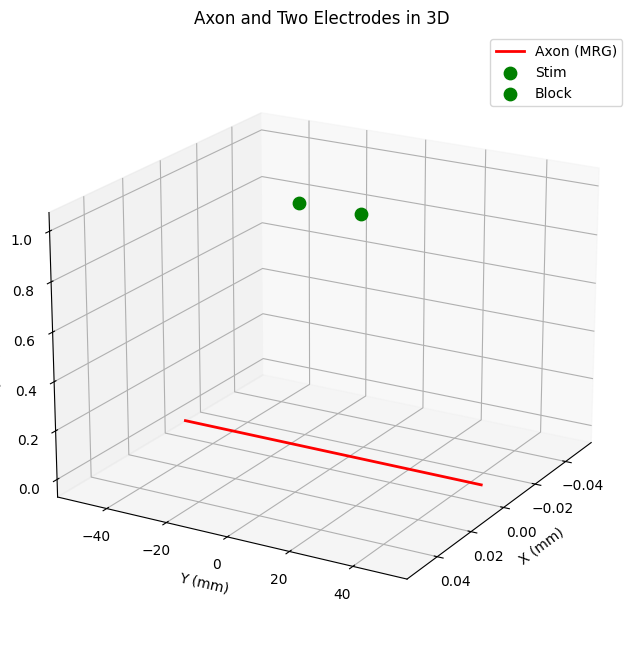

In [74]:
pointsources = [pointsource_stim, pointsource_block]
labels = ['Stim','Block']
plot_setup(mrg, pointsources, labels)

In [75]:
# Create the simulation environment
env = SimulationEnvironment(
    axons=[mrg],
    extra_stim=[electrode_stim,
                electrode_block
                ],
    monitors=[
        v_rec,
        ap_monitor_end,
        ap_monitor_start
    ]
)

# Run the simulation for a sufficient duration to observe AP propagation
env.run(6 * ms, early_stopping=False)

# ap_count_end = ap_monitor_end.n(t=0.14 * ms)
# print(f"Number of APs after 0.14 ms at end node: {ap_count_end}")
#
# ap_times_end = ap_monitor_end.spikes()
# print(f"All spike times at end node: {ap_times_end}")
#
# ap_times_start = ap_monitor_start.spikes()
# print(f"All spike times at start node: {ap_times_start}")
#
# if ap_count_end == 1:
#     print("AP NOT blocked")
# else:
#     print("AP is blocked")

5.5 ms: 100%|██████████| 6000/6000 [01:53<00:00, 52.97it/s]



Simulation Environment:
  # axons: 1
  # extracellular stimulating electrodes: 2
  dt: 0.001 ms

In [76]:
v_records = v_rec.v.copy()

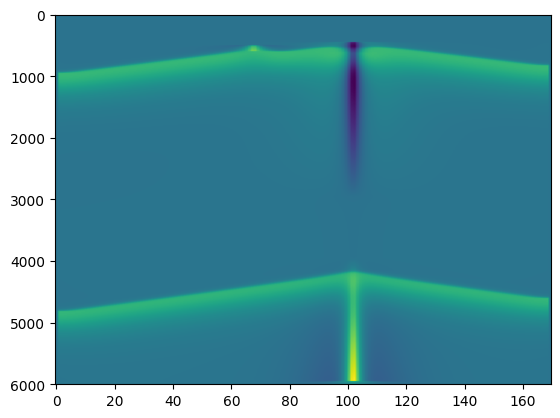

In [77]:
plt.imshow(v_records.T,aspect='auto')

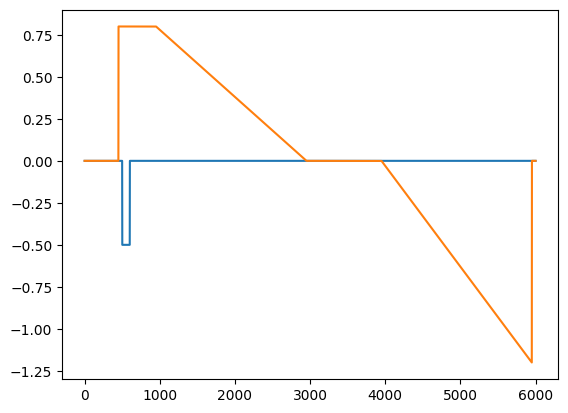

In [78]:
plt.plot(stim(v_rec.t).tolist())
plt.plot(block(v_rec.t).tolist())

In [ ]:
####
# TODO HERE
####


In [124]:
def run_simulation(block_amp, block_pw, block_delay, plotting=True):

    """
    Using notation of Analysis of Nerve Conduction Block Induced by Direct Current (helpful)

    @param block_amp:
    @param block_pw:
    @param block_delay:
    @return:
    """
    # Set desired diameter and length
    diameter = 27 * um
    length = 60 * mm

    # Create the axon without specifying axonnodes
    mrg = MRG(diameter=diameter, length=length, v_init=-80.0 * mV)

    print(f"Configuration: Amplitude {block_amp:.2f} mA, pulse width {block_pw:.2f} ms, delay {block_delay:.2f}")

    # Setup a default (fixed) stimulation values

    stim_amp = -0.2 * mA
    stim_pw = 0.05 * ms
    stim_delay = 2.5 * ms

    # Create stimuli
    stim = MonophasicPulse(amp=stim_amp, pw=stim_pw, delay=stim_delay)
    block = MonophasicPulse(amp=block_amp, pw=block_pw, delay=block_delay)

    # Create electrodes at both ends (set spacing of 6 mm)
    pointsource_stim = IsotropicPoint(x=0 * mm, y=-10 * mm, z=1 * mm, rhoe=500 * ohm * cm)
    pointsource_block = IsotropicPoint(x=0 * mm, y=10 * mm, z=1 * mm, rhoe=500 * ohm * cm)

    # Assign stimuli to electrodes
    electrode_stim = pointsource_stim << stim
    electrode_block = pointsource_block << block

    # Set up monitors
    ap_monitor_end = APMonitor(mrg.node[-10], threshold= -20 * mV)
    ap_monitor_start = APMonitor(mrg.node[10], threshold= -20 * mV)
    v_rec = StateMonitor(mrg.node, "v")

    # Create the simulation environment
    env = SimulationEnvironment(
        axons=[mrg],
        extra_stim=[electrode_stim, electrode_block],
        monitors=[v_rec, ap_monitor_end, ap_monitor_start]
    )

    # Run the simulation for a sufficient duration to observe AP propagation
    env.run(5 * ms, early_stopping=False)

    ap_count_end = ap_monitor_end.n(t=2.50 * ms)
    print(f"Number of APs after 2.50 ms at end node: {ap_count_end}")

    start_time = 2.50 * ms
    end_time = 3.10 * ms

    # Calculate the number of APs between start_time and end_time at the start node
    ap_count_start_end = ap_monitor_start.n(t=end_time)
    ap_count_start_start = ap_monitor_start.n(t=start_time)
    ap_count_left = ap_count_start_start - ap_count_start_end # Never less than zero
    print(f"Number of APs between {start_time} and {end_time} ms at start node: {ap_count_left}")

    ap_times_end = ap_monitor_end.spikes()
    print(f"All spike times at end node: {ap_times_end}")

    if ap_count_end > 0:
        print("AP NOT blocked")
        return 0
    else:
        if ap_count_left == 0:
            print('NO AP at the left side')
            return 0
        else:
            print("AP is blocked")
            if plotting:
                plot_stims(v_rec, 5, -5, stim, block)
            return 1


In [125]:
# v_rec._rec_v

In [126]:
v_rec.__dict__.keys()

dict_keys(['compartments', 'state_vars', '_rec_v', '_t', '_StateMonitor__x', '_StateMonitor__y', '_StateMonitor__z', '__cache__', 'dtype'])

In [127]:
def ap_blocking_objective(params):
    """
    Objective function to optimize AP blocking
    """
    stim_amp, stim_pw, stim_delay = params[:, 0], params[:, 1], params[:, 2]
    
    observations = []
    
    for amp, pw, delay in zip(stim_amp, stim_pw, stim_delay):
        # Run the simulation with given parameters
        try:
            # Run the simulation and get the AP observation
            ap_count = run_simulation(amp, pw, delay)
            observations.append(ap_count)

        except Exception as e:
            print(f"Simulation failed with amp={amp}, pulse width={pw}, delay={delay}: {e}")
            observations.append(np.nan)  

    return np.array(observations).reshape(-1, 1)


In [128]:
# #amp, pw, delay = qp[0]
# block_amp, block_pw, block_delay = qp[0]
# #ap_count = run_simulation(amp, pw, delay)
# block_amp, block_pw, block_delay = 4.000000, 2.579937, 0.835881
# #block_amp, block_pw, block_delay = 0.899537,2.885421,0.692172



In [129]:
# first_node_y = mrg.node[0].y3d(0)
# last_node_y = mrg.node[-1].y3d(0)
# total_length = (last_node_y - first_node_y) / 1000
# print(first_node_y, last_node_y)
# print(total_length)

In [130]:
# total_length/len(mrg.node)

In [131]:
# disc_nodes = int(10/(total_length/len(mrg.node)))

In [132]:
diameter = 27 * um
length = 60 * mm

# Create the axon without specifying axonnodes
mrg = MRG(diameter=diameter, length=length, v_init=-80.0 * mV)

print(f"Configuration: Amplitude {block_amp:.2f} mA, pulse width {block_pw:.2f} ms, delay {block_delay:.2f}")

# Setup a default (fixed) stimulation values

stim_amp = -1 * mA
stim_pw = 0.05 * ms
stim_delay = 2.5 * ms

# Create stimuli
stim = MonophasicPulse(amp=stim_amp, pw=stim_pw, delay=stim_delay)
block = MonophasicPulse(amp=block_amp, pw=block_pw, delay=block_delay)

# Create electrodes at both ends (set spacing of 6 mm)
pointsource_stim = IsotropicPoint(x=0 * mm, y=-10 * mm, z=1 * mm, rhoe=500 * ohm * cm)
pointsource_block = IsotropicPoint(x=0 * mm, y=10 * mm, z=1 * mm, rhoe=500 * ohm * cm)

# Assign stimuli to electrodes
electrode_stim = pointsource_stim << stim
electrode_block = pointsource_block << block

# Set up monitors
ap_monitor_end = APMonitor(mrg.node[34], threshold= -20 * mV)
ap_monitor_start = APMonitor(mrg.node[68], threshold= -20 * mV)
v_rec = StateMonitor(mrg.node, "v")

# Create the simulation environment
env = SimulationEnvironment(
    axons=[mrg],
    extra_stim=[electrode_stim, electrode_block],
    monitors=[v_rec, ap_monitor_end, ap_monitor_start]
)

# Run the simulation for a sufficient duration to observe AP propagation
env.run(5 * ms, early_stopping=False)

ap_count_end = ap_monitor_end.n(t=2.50 * ms)
print(f"Number of APs after 2.50 ms at end node: {ap_count_end}")

start_time = 2.50 * ms
end_time = 3.10 * ms

# Calculate the number of APs between start_time and end_time at the start node
ap_count_start_end = ap_monitor_start.n(t=end_time)
ap_count_start_start = ap_monitor_start.n(t=start_time)
ap_count_left = ap_count_start_start - ap_count_start_end # Never less than zero
print(f"Number of APs between {start_time} and {end_time} ms at start node: {ap_count_left}")

ap_times_end = ap_monitor_end.spikes()
print(f"All spike times at end node: {ap_times_end}")

if ap_count_end > 0:
    print("AP NOT blocked")
else:
    if ap_count_left == 0:
        print('NO AP at the left side')
    else:
        print("AP is blocked")


Configuration: Amplitude 0.80 mA mA, pulse width 0.50 ms ms, delay 0.10 ms


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:03<00:00, 250.65it/s]

Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.325 1.725 2.51 ]
AP NOT blocked


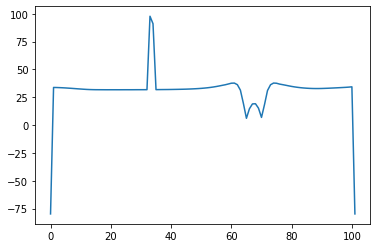

In [133]:
plt.plot(np.max(v_rec.v,axis=1))

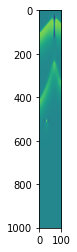

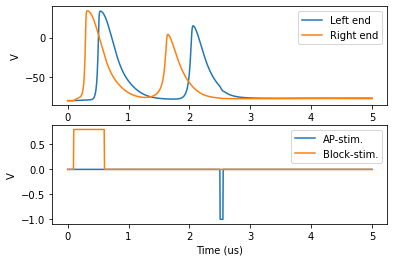

In [134]:
plot_stims(v_rec, 5, -5, stim, block)

In [135]:
# print( ap_monitor_end._spikes.to_python())
# print( ap_monitor_start._spikes.to_python())

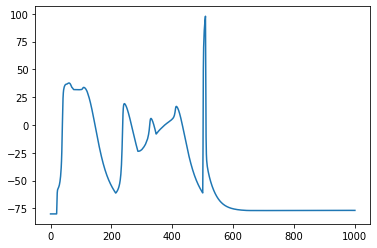

In [136]:
fig, ax = plt.subplots()
ax.plot(np.max(vs,axis=1))

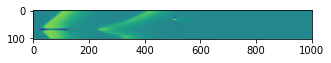

In [137]:
fig, ax = plt.subplots(figsize=(5,5))
ax.imshow(getattr(v_rec,"v"))


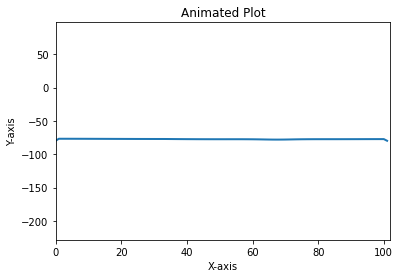

In [138]:
# Initialize the plot
fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)

# Set plot limits
ax.set_xlim(0, vs.shape[1])
ax.set_ylim(np.min(vs), np.max(vs))
ax.set_title("Animated Plot")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")

# Update function for animation
def update(frame):
    line.set_data(range(vs.shape[1]), vs[frame, :])
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=range(vs.shape[0]), blit=True, interval=200)

# Display the animation in Jupyter
from IPython.display import HTML
HTML(ani.to_jshtml())

Configuration: Amplitude 2.56 mA, pulse width 2.52 ms, delay 1.60


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 161.48it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.69]
NO AP at the left side
Configuration: Amplitude -0.73 mA, pulse width 1.67 ms, delay 0.11


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.13it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.445 3.035]
AP NOT blocked
Configuration: Amplitude -2.33 mA, pulse width 0.52 ms, delay 1.55


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 164.52it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [2.26]
NO AP at the left side
Configuration: Amplitude 3.59 mA, pulse width 3.10 ms, delay 0.44


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 171.67it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.525]
AP is blocked


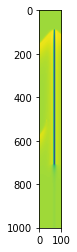

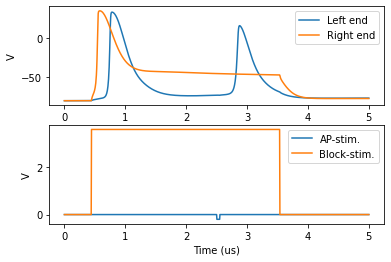

Configuration: Amplitude -3.22 mA, pulse width 2.04 ms, delay 1.89


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.94it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [4.175]
AP NOT blocked
Configuration: Amplitude 0.78 mA, pulse width 2.52 ms, delay 1.45


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 167.46it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.615 3.335]
AP NOT blocked
Configuration: Amplitude -3.54 mA, pulse width 2.65 ms, delay 1.96


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 166.09it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [4.87]
AP NOT blocked
Configuration: Amplitude 2.60 mA, pulse width 0.83 ms, delay 1.66


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.95it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.75]
NO AP at the left side
Configuration: Amplitude -0.18 mA, pulse width 1.37 ms, delay 0.41


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 169.19it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.665]
NO AP at the left side
Configuration: Amplitude -3.44 mA, pulse width 0.63 ms, delay 1.29


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 162.78it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [2.135]
NO AP at the left side
Configuration: Amplitude 3.60 mA, pulse width 0.16 ms, delay 1.16


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 166.28it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.245]
NO AP at the left side
Configuration: Amplitude -3.42 mA, pulse width 1.65 ms, delay 1.28


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 169.55it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [3.155]
AP NOT blocked
Configuration: Amplitude -1.58 mA, pulse width 2.80 ms, delay 0.74


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 163.27it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.485]
NO AP at the left side
Configuration: Amplitude -1.97 mA, pulse width 2.20 ms, delay 1.47


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 167.11it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: []
NO AP at the left side
Configuration: Amplitude 3.35 mA, pulse width 1.37 ms, delay 0.18


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 167.98it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.265]
NO AP at the left side
Configuration: Amplitude 0.83 mA, pulse width 2.85 ms, delay 1.19


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.21it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.35]
NO AP at the left side
Configuration: Amplitude 0.38 mA, pulse width 3.18 ms, delay 1.13


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 159.98it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.445 3.8  ]
AP NOT blocked
Configuration: Amplitude -3.76 mA, pulse width 0.16 ms, delay 0.51


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 165.09it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.93]
NO AP at the left side
Configuration: Amplitude 1.56 mA, pulse width 3.00 ms, delay 0.39


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 166.41it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.505]
AP is blocked


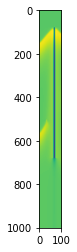

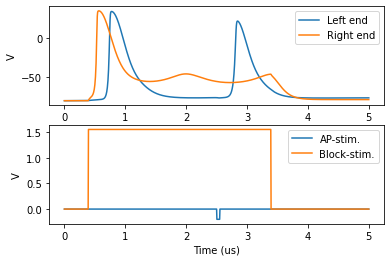

Configuration: Amplitude 1.70 mA, pulse width 2.61 ms, delay 0.17


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 162.61it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.28]
AP is blocked


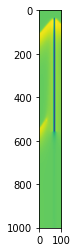

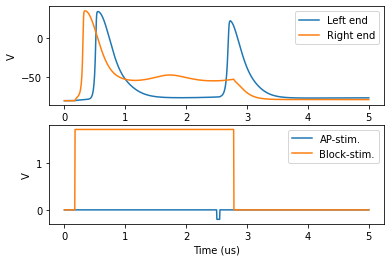

Configuration: Amplitude -2.63 mA, pulse width 2.52 ms, delay 1.48


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 167.92it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [4.3]
AP NOT blocked
Configuration: Amplitude -2.19 mA, pulse width 0.92 ms, delay 1.84


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.20it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [2.975]
AP NOT blocked
Configuration: Amplitude -3.98 mA, pulse width 2.48 ms, delay 0.30


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 161.53it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [3.03]
AP NOT blocked
Configuration: Amplitude 0.04 mA, pulse width 1.30 ms, delay 0.51


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 166.43it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.965]
AP NOT blocked
Configuration: Amplitude 3.18 mA, pulse width 1.89 ms, delay 1.12


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 170.61it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.2]
NO AP at the left side
Configuration: Amplitude -2.11 mA, pulse width 1.66 ms, delay 0.54


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 164.33it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.475]
AP is blocked


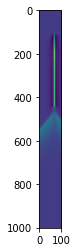

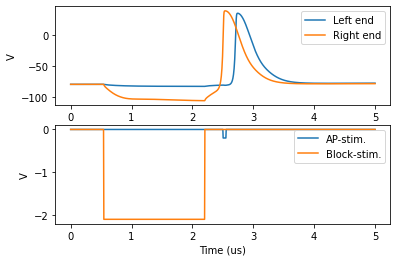

Configuration: Amplitude -2.33 mA, pulse width 1.34 ms, delay 0.97


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.30it/s]
2025-01-08 23:52:54,435 rank[0] [INFO] The pulse ends after the simulation end time.


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.54]
AP NOT blocked
Configuration: Amplitude -1.01 mA, pulse width 3.10 ms, delay 1.98


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 167.16it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.445]
AP is blocked


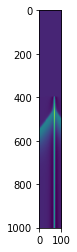

2025-01-08 23:53:00,523 rank[0] [INFO] The pulse ends after the simulation end time.


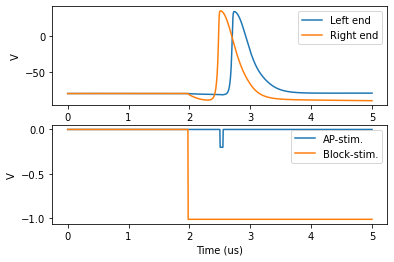

Configuration: Amplitude 3.69 mA, pulse width 3.07 ms, delay 1.40


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 165.98it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.48]
NO AP at the left side
Configuration: Amplitude 2.20 mA, pulse width 3.23 ms, delay 0.65


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 161.34it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.75]
AP is blocked


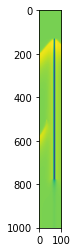

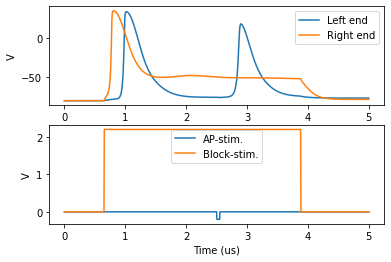

Configuration: Amplitude -2.04 mA, pulse width 2.68 ms, delay 1.88


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 168.45it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: []
NO AP at the left side
Configuration: Amplitude 1.05 mA, pulse width 1.16 ms, delay 0.64


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 166.98it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.775]
NO AP at the left side
Configuration: Amplitude 2.51 mA, pulse width 0.34 ms, delay 0.40


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 153.26it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.49 3.1 ]
AP NOT blocked
Configuration: Amplitude 2.79 mA, pulse width 2.17 ms, delay 1.47


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 166.74it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.555]
NO AP at the left side
Configuration: Amplitude 1.24 mA, pulse width 0.63 ms, delay 1.52


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:05<00:00, 166.80it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.65]
NO AP at the left side
Configuration: Amplitude -2.00 mA, pulse width 2.01 ms, delay 1.60


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 164.64it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [4.075]
AP NOT blocked
Configuration: Amplitude -0.62 mA, pulse width 1.26 ms, delay 1.40


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 160.74it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.695]
NO AP at the left side
Configuration: Amplitude -1.62 mA, pulse width 2.60 ms, delay 0.59


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 162.41it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.36  3.755]
AP NOT blocked
Configuration: Amplitude 0.52 mA, pulse width 2.20 ms, delay 0.57


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 150.60it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.795 2.76 ]
AP NOT blocked
Configuration: Amplitude -3.36 mA, pulse width 1.23 ms, delay 1.99


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:07<00:00, 142.41it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [3.43]
AP NOT blocked


In [139]:
# Define parameter bounds
lb = [-4.00, 0.05, 0.10]  # Lower bounds for [stim_amp, stim_pw, stim_delay]
ub = [4.00, 3.50, 2.00]  # Upper bounds

# Initialize scaler
scaler = CustomMinMaxScaler(feature_min=lb, feature_max=ub, output_range=(-1, 1))

# Define search space
search_space = space.Box(lower=[-1, -1, -1], upper=[1, 1, 1])

# Generate initial samples
init_samples = 40
qp_minmax = search_space.sample(init_samples).numpy()
qp = scaler.inverse_transform(qp_minmax)

observations = ap_blocking_objective(qp)

In [140]:
# Create initial dataset (set query point in minmax)
init_dataset = Dataset(query_points=tf.cast(qp_minmax, tf.float64),
                       observations=tf.cast(observations, tf.float64))

# Initialize lists to collect all data
all_qp = []
all_observations = []
all_sample_types = []

# Collect initial data
all_qp.append(qp)
all_observations.append(observations)
all_sample_types.extend(['Initial'] * len(qp))

# Build model
model_config = {
    'classification': True,
    'variational': True,
    'sparse': False,
    'trainable_likelihood': True,
    'noise_free': True,
}

online_model = build_model(init_dataset, search_space, model_config)

# Set up acquisition function and rule
acq = BayesianActiveLearningByDisagreement()
rule = EfficientGlobalOptimization(builder=acq, 
                                   num_query_points=1)

# Initialize optimizer
ask_tell = AskTellOptimizerHistory(search_space=search_space,
                                   datasets=init_dataset,
                                   models=online_model,
                                   acquisition_rule=rule,
                                   fit_model=True,
                                   overwrite=True,
                                   track_path='nerve_block')

2025-01-08 23:54:18,438 rank[0] [INFO] The pulse ends after the simulation end time.


Configuration: Amplitude -0.81 mA, pulse width 3.23 ms, delay 2.00


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 157.17it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.365]
AP is blocked


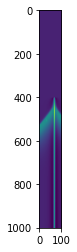

2025-01-08 23:54:24,955 rank[0] [INFO] The pulse ends after the simulation end time.


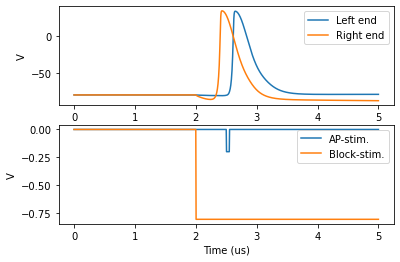

Configuration: Amplitude 1.05 mA, pulse width 3.50 ms, delay 0.10


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 150.44it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.24]
AP is blocked


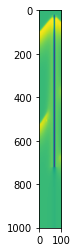

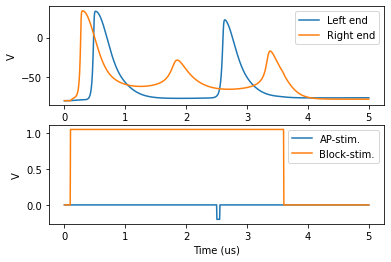

Configuration: Amplitude 4.00 mA, pulse width 2.43 ms, delay 0.10


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 156.86it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.18]
NO AP at the left side
Configuration: Amplitude -2.36 mA, pulse width 1.63 ms, delay 0.51


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 159.18it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.385]
AP is blocked


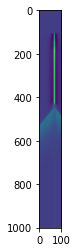

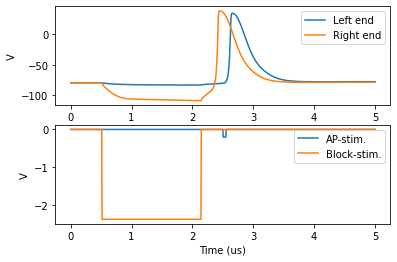

Configuration: Amplitude -2.46 mA, pulse width 1.61 ms, delay 0.50


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 155.31it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.35]
AP is blocked


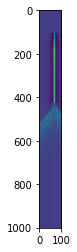

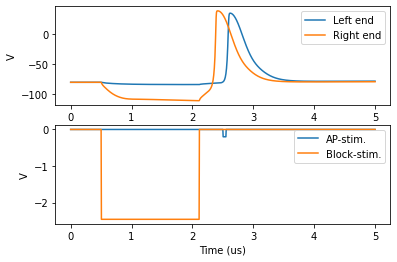

Configuration: Amplitude -2.50 mA, pulse width 1.61 ms, delay 0.49


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 159.16it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.34]
AP is blocked


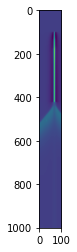

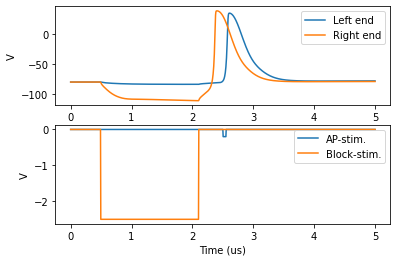

Configuration: Amplitude -2.53 mA, pulse width 1.60 ms, delay 0.49


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 155.00it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.33]
AP is blocked


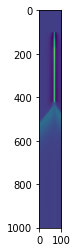

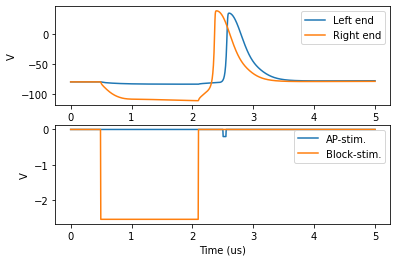

Configuration: Amplitude -2.55 mA, pulse width 1.60 ms, delay 0.49


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 148.44it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.32]
AP is blocked


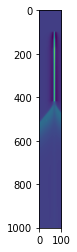

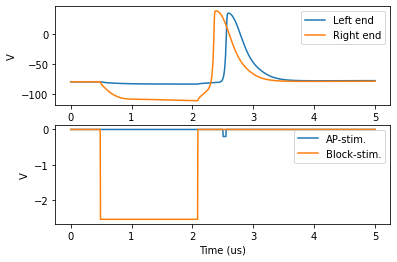

Configuration: Amplitude -2.57 mA, pulse width 1.60 ms, delay 0.49


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 149.58it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.315]
AP is blocked


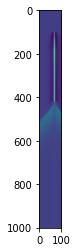

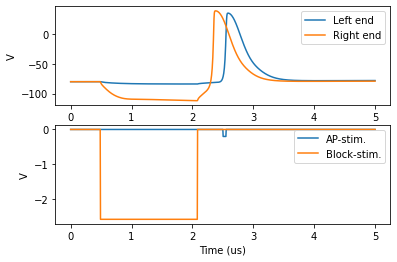

Configuration: Amplitude -2.58 mA, pulse width 1.59 ms, delay 0.49


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 144.84it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.315]
AP is blocked


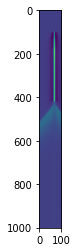

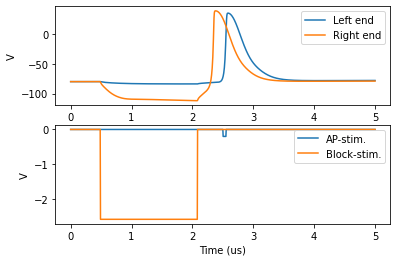

Configuration: Amplitude -2.59 mA, pulse width 1.59 ms, delay 0.48


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 149.31it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.31]
AP is blocked


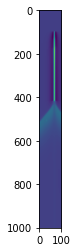

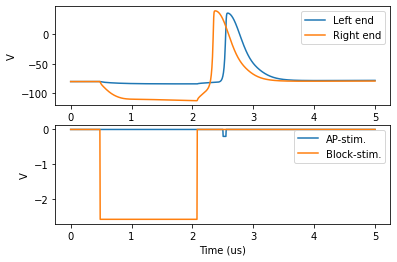

Configuration: Amplitude -0.40 mA, pulse width 3.09 ms, delay 0.10


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 147.99it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.35]
NO AP at the left side
Configuration: Amplitude 3.71 mA, pulse width 3.50 ms, delay 0.10


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 152.62it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [0.18]
NO AP at the left side
Configuration: Amplitude 3.47 mA, pulse width 3.50 ms, delay 0.79


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 153.15it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.87]
AP is blocked


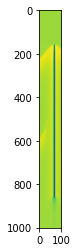

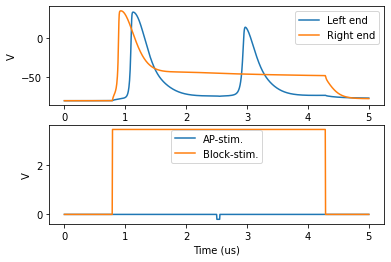

Configuration: Amplitude 2.74 mA, pulse width 2.36 ms, delay 0.62


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 146.33it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.705]
AP is blocked


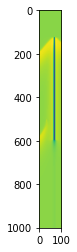

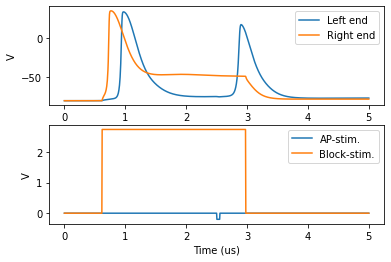

2025-01-08 23:56:14,249 rank[0] [INFO] The pulse ends after the simulation end time.


Configuration: Amplitude 0.18 mA, pulse width 3.50 ms, delay 2.00


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 153.35it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [2.925]
AP NOT blocked
Configuration: Amplitude 4.00 mA, pulse width 2.42 ms, delay 0.74


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 146.59it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.815]
AP is blocked


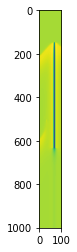

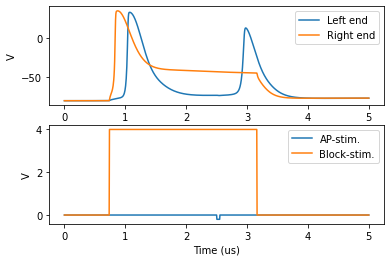

Configuration: Amplitude 2.46 mA, pulse width 3.50 ms, delay 0.96


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 156.96it/s]

Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [1.055]
AP is blocked


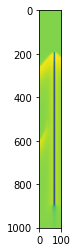

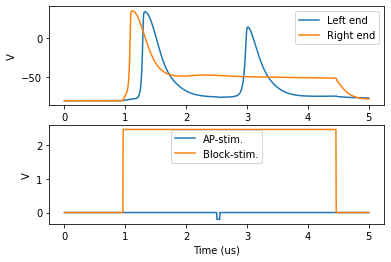

Configuration: Amplitude -2.28 mA, pulse width 0.83 ms, delay 0.25


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 151.07it/s]


Number of APs after 2.50 ms at end node: 0
Number of APs between 2.5 ms and 3.1 ms ms at start node: 0
All spike times at end node: [1.28]
NO AP at the left side
Configuration: Amplitude 0.90 mA, pulse width 3.50 ms, delay 0.63


4.5 ms: 100%|██████████████████████████████| 1000/1000 [00:06<00:00, 142.95it/s]


Number of APs after 2.50 ms at end node: 1
Number of APs between 2.5 ms and 3.1 ms ms at start node: 1
All spike times at end node: [0.785 4.055]
AP NOT blocked


In [141]:
# Optimization loop
max_iters = 20  # Increase the number of iterations as needed
iter = 0

dict_iters = dict()

while iter < max_iters:
    print(f"Iteration {iter}/{max_iters}", end='\r')

    qp_minmax_new = ask_tell.ask_and_save().numpy()
    qp_new = scaler.inverse_transform(qp_minmax_new)

    #print(f"Configuration: amplitude {qp_new[-1, 0]:.2f} mA, pulse with {qp_new[-1, 1]:.2f} with delay {qp_new[-1, 2]:.2f} ms")

    # Run the simulation and get observations
    observations_new = ap_blocking_objective(qp_new)

    if observations_new.ndim == 1:
        observations_new = observations_new.reshape(-1, 1)

    # Collect data
    all_qp.append(qp_new)
    all_observations.append(observations_new)
    all_sample_types.extend(['Optimization'] * len(qp_new))

    # Create the new dataset
    tagged_output = Dataset(query_points=tf.cast(qp_minmax_new, tf.float64),
                            observations=tf.cast(observations_new, tf.float64))
    
    # Update the optimizer with new data
    ask_tell.tell(tagged_output)
    iter += 1

# Save results
ask_tell.save()

(34, 6)
(6, 6)
(6, 6)
(14, 6)


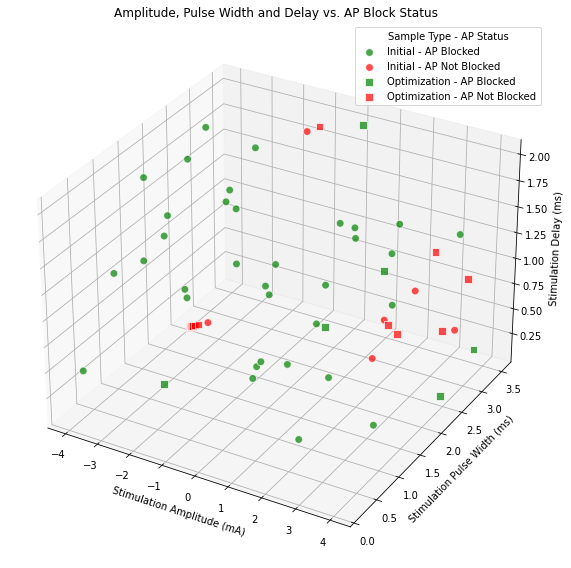

In [142]:
import pandas as pd

# Concatenate all data
all_qp_array = np.vstack(all_qp)
all_observations_array = np.vstack(all_observations).flatten()
all_sample_types_array = np.array(all_sample_types)

# Create DataFrame
df = pd.DataFrame(all_qp_array, columns=['stim_amp', 'stim_pulse', 'stim_delay'])
df['ap_count'] = all_observations_array
df['sample_type'] = all_sample_types_array

# Map 'ap_count' to labels
df['ap_status'] = df['ap_count'].map({0: 'AP Blocked', 1: 'AP Not Blocked'})

# Define markers and colors
markers = {'Initial': 'o', 'Optimization': 's'}
colors = {'AP Not Blocked': 'red', 'AP Blocked': 'green'}

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for sample_type in df['sample_type'].unique():
    for ap_status in df['ap_status'].unique():
        subset = df[(df['sample_type'] == sample_type) & (df['ap_status'] == ap_status)]
        print(subset.shape)
        if not subset.empty:
            ax.scatter(
                subset['stim_amp'],
                subset['stim_pulse'],
                subset['stim_delay'],
                c=colors[ap_status],
                marker=markers[sample_type],
                label=f"{sample_type} - {ap_status}",
                alpha=0.7,
                edgecolors='w',  # Adds white borders to markers for better visibility
                s=60  # Increases marker size for better visibility
            )

# Remove duplicate labels in legend
handles, labels = ax.get_legend_handles_labels()
unique = dict(zip(labels, handles))
ax.legend(unique.values(), unique.keys(), title='Sample Type - AP Status', loc='best')

ax.set_xlabel('Stimulation Amplitude (mA)')
ax.set_ylabel('Stimulation Pulse Width (ms)')
ax.set_zlabel('Stimulation Delay (ms)')
ax.set_title('Amplitude, Pulse Width and Delay vs. AP Block Status')

plt.tight_layout()
plt.show()

In [143]:
df.sort_values(axis=0, by='ap_status').head(10)

df[df['ap_status'] == 'AP Blocked']

,stim_amp,stim_pulse,stim_delay,ap_count,sample_type,ap_status
0,2.557921,2.523353,1.596903,0,Initial,AP Blocked
1,-0.733769,1.674097,0.112853,0,Initial,AP Blocked
2,-2.329902,0.523220,1.553172,0,Initial,AP Blocked
4,-3.217870,2.036079,1.894120,0,Initial,AP Blocked
5,0.780163,2.524857,1.449660,0,Initial,AP Blocked
6,-3.541855,2.648110,1.964030,0,Initial,AP Blocked
7,2.602966,0.832053,1.659410,0,Initial,AP Blocked
8,-0.179953,1.370277,0.408539,0,Initial,AP Blocked
9,-3.442773,0.634904,1.292146,0,Initial,AP Blocked
10,3.596908,0.163210,1.164784,0,Initial,AP Blocked
